# ANALYSIS OF VENUES FOR FOREIGN VISITORS IN TOKYO

### Coursera IBM DataScience Capstone project
Link to the full report : https://github.com/belanello/Coursera_Capstone/blob/master/full_report.pdf<br>
Link to the notebook with folium map :


## (2) Data Understanding/Preparation/Modeling

In this project, we want to find out, which areas must be developed better for the foreign tourists staying in Tokyo. 
To answer the question, we need to know, if they arrive in any stations in Tokyo, how many of those basic venues they can find in walking distance. I took 4 steps below to prepare data and model.

1. Group the data by stations and count how many each basic venue they have in walking distance.
2. Cluster the stations according to the counts.
3. Visualize the cluster on the map and see where they locate.
4. Find out any area we can develop better.

In [1]:
# import basic libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.core.display import HTML
import folium

In [2]:
# import stations data
stations = pd.read_csv('stations.csv')
stations

,station,latitude,longitude
0,Adachi-Odai Station,35.754801,139.770404
1,Aihara Station,35.606819,139.331686
2,Akabane Station,35.778139,139.720800
3,Akabane-iwabuchi Station,35.782968,139.719853
4,Akabanebashi Station,35.654987,139.743891
...,...,...,...
637,Zōshiki Station,35.550041,139.715202
638,Itabashi Kuyakushomae Station,35.751809,139.709718
639,Shimo-Shimmei Station,35.608871,139.726232
640,Shōin-Jinjamae Station,35.644143,139.655263


In [3]:
#import all data collected from previous notebook
data = pd.read_csv('all_data.csv')
data

,station,id,name,venue_lat,venue_lng,categories,classes
0,Adachi-Odai Station,4d21b00af7a9a1437e48389f,Ryota Kuga's Guest House,35.746466,139.771546,Hostel,Hotels
1,Adachi-Odai Station,59a382f5cad1b628d2f030f5,東京ゲストハウス2020,35.743168,139.771271,Hostel,Hotels
2,Adachi-Odai Station,53f45d47498e66d089216755,Tokyo Guest House B&B Hostel (東京ゲストハウス B&B ホステル),35.743172,139.771286,Hostel,Hotels
3,Aihara Station,4ce533fa5fce5481a53d5aaa,Laxio-Inn (ホテル ラクシオ・イン),35.610112,139.344740,Hotel,Hotels
4,Aihara Station,5b6c2cf9e65d0c002ced1699,ホテル anniversary,35.611662,139.343505,Hotel,Hotels
...,...,...,...,...,...,...,...
139987,Yushima Station,5b0e7ba6a2a6ce002c79fc2b,Ueno Information Center,35.710779,139.775775,Tourist Information Center,Tourist Information Center
139988,Yushima Station,4ce14895c9a0a0903596246a,Tokyo Tourist Information Center (東京観光情報センター),35.710783,139.773482,Tourist Information Center,Tourist Information Center
139989,Yushima Station,57368551498ed9b3ec5509db,Park Information Center (公園案内所),35.714783,139.775900,Tourist Information Center,Tourist Information Center
139990,Yushima Station,5e4256344c4a85000888edc8,General Information Center (総合案内所),35.716144,139.772131,Tourist Information Center,Tourist Information Center


In [4]:
# theres no duplicated data
data.duplicated().sum()

0

In [5]:
# all the rows have data
data.isnull().sum()

station       0
id            0
name          0
venue_lat     0
venue_lng     0
categories    0
classes       0
dtype: int64

In [6]:
data

,station,id,name,venue_lat,venue_lng,categories,classes
0,Adachi-Odai Station,4d21b00af7a9a1437e48389f,Ryota Kuga's Guest House,35.746466,139.771546,Hostel,Hotels
1,Adachi-Odai Station,59a382f5cad1b628d2f030f5,東京ゲストハウス2020,35.743168,139.771271,Hostel,Hotels
2,Adachi-Odai Station,53f45d47498e66d089216755,Tokyo Guest House B&B Hostel (東京ゲストハウス B&B ホステル),35.743172,139.771286,Hostel,Hotels
3,Aihara Station,4ce533fa5fce5481a53d5aaa,Laxio-Inn (ホテル ラクシオ・イン),35.610112,139.344740,Hotel,Hotels
4,Aihara Station,5b6c2cf9e65d0c002ced1699,ホテル anniversary,35.611662,139.343505,Hotel,Hotels
...,...,...,...,...,...,...,...
139987,Yushima Station,5b0e7ba6a2a6ce002c79fc2b,Ueno Information Center,35.710779,139.775775,Tourist Information Center,Tourist Information Center
139988,Yushima Station,4ce14895c9a0a0903596246a,Tokyo Tourist Information Center (東京観光情報センター),35.710783,139.773482,Tourist Information Center,Tourist Information Center
139989,Yushima Station,57368551498ed9b3ec5509db,Park Information Center (公園案内所),35.714783,139.775900,Tourist Information Center,Tourist Information Center
139990,Yushima Station,5e4256344c4a85000888edc8,General Information Center (総合案内所),35.716144,139.772131,Tourist Information Center,Tourist Information Center


In [7]:
# check if all the data were merged in the dataframe
data['classes'].unique()

array(['Hotels', 'Restaurants', 'Convenience stores', 'ATMs/Exchanges',
       'Cafes', 'Parks', 'Pharmacies', 'Tourist Information Center'],
      dtype=object)

In [8]:
# find out how many of each venue are within Tokyo
mask_list = dict()
cat_list = ['Hotels', 'Restaurants', 'Convenience stores', 'ATMs/Exchanges',
       'Cafes', 'Parks', 'Pharmacies', 'Tourist Information Center']
for cat in cat_list:
    mask = data['classes']==cat
    mask_list[cat] = mask    

In [9]:
total = dict()
for k,v in mask_list.items():
    total[k] = len(data[v]['id'].unique())
    
total_df = pd.DataFrame(total,index=['Venue'])

In [10]:
# we can find below number of venues within 1000m radius from all the stations in Tokyo
total_df = total_df.T

In [11]:
total_df

,Venue
Hotels,2062
Restaurants,13191
Convenience stores,6899
ATMs/Exchanges,4939
Cafes,6617
Parks,5925
Pharmacies,4562
Tourist Information Center,33


### 1.Group the data by stations and count how many each basic venue they have in walking distance.

In [12]:
# count how many venues each stations has
# transform 'classes' columns to numerical values for clustering
dummies = pd.get_dummies(data[['classes']], prefix='', prefix_sep='')
dummies['station'] = data['station']
counts = dummies.groupby('station').sum().reset_index()

In [13]:
# fix columns in order
counts = counts[['station','Hotels','Restaurants','Convenience stores','ATMs/Exchanges','Cafes','Parks','Pharmacies','Tourist Information Center']]

In [14]:
# daraframe shows the number of the venues in walking distance 
counts

,station,Hotels,Restaurants,Convenience stores,ATMs/Exchanges,Cafes,Parks,Pharmacies,Tourist Information Center
0,Adachi-Odai Station,3,50,18,14,16,19,9,0
1,Aihara Station,2,40,10,7,3,11,3,0
2,Akabane Station,22,50,50,31,46,17,30,0
3,Akabane-iwabuchi Station,22,50,50,29,46,14,30,0
4,Akabanebashi Station,45,49,50,40,47,46,49,0
...,...,...,...,...,...,...,...,...,...
637,Ōtorii Station,18,50,41,29,17,43,17,0
638,Ōtsuka Station,39,50,50,38,49,50,49,0
639,Ōtsuka-Teikyō-Daigaku Station,3,48,14,12,7,23,2,0
640,Ōtsuka-ekimae Station,38,50,50,43,49,50,49,0


In [15]:
counts = counts.set_index('station')
counts

,Hotels,Restaurants,Convenience stores,ATMs/Exchanges,Cafes,Parks,Pharmacies,Tourist Information Center
station,,,,,,,,
Adachi-Odai Station,3,50,18,14,16,19,9,0
Aihara Station,2,40,10,7,3,11,3,0
Akabane Station,22,50,50,31,46,17,30,0
Akabane-iwabuchi Station,22,50,50,29,46,14,30,0
Akabanebashi Station,45,49,50,40,47,46,49,0
...,...,...,...,...,...,...,...,...
Ōtorii Station,18,50,41,29,17,43,17,0
Ōtsuka Station,39,50,50,38,49,50,49,0
Ōtsuka-Teikyō-Daigaku Station,3,48,14,12,7,23,2,0


In [16]:
# Since we cannot get particular ATMs data from foursquareAPI, ATMs column contains data from the other source.
# To align with the other features, set Maximum values 50.
counts.loc[counts['ATMs/Exchanges']>50,'ATMs/Exchanges'] = 50

In [17]:
# check if data doesn't have more than 50 data
counts[counts['ATMs/Exchanges']>50]

,Hotels,Restaurants,Convenience stores,ATMs/Exchanges,Cafes,Parks,Pharmacies,Tourist Information Center
station,,,,,,,,


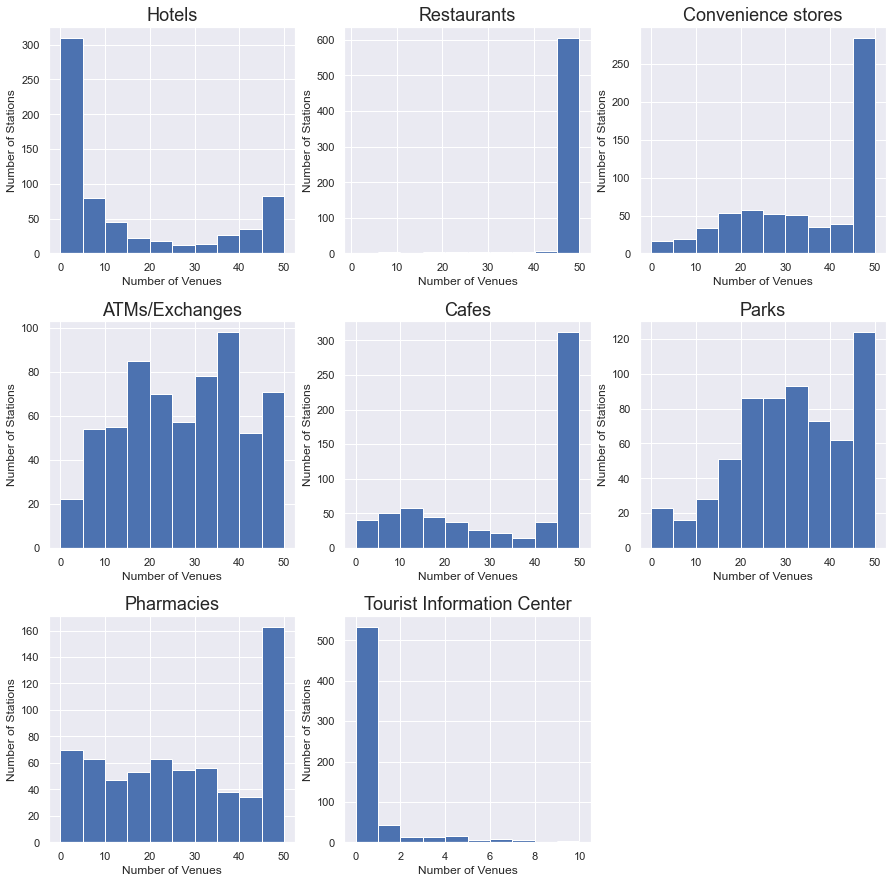

In [18]:
# let's check the distribution first
sns.set()
num = list(range(1,9))
fig = plt.figure(figsize=(15,15))
for i, col in zip(num, counts.columns):
    ax = fig.add_subplot(3,3,i)
    ax.set_title(col,fontsize=18)
    ax.set_xlabel('Number of Venues')
    ax.set_ylabel('Number of Stations')
    plt.subplots_adjust(hspace=0.3)
    counts[col].hist(bins=10)

In [19]:
# we found that half of the stations has less than 5 hotels in walking distance
# let's look into distribution of the hotel on the map

hotel_data = data[data['classes']=='Hotels']

In [20]:
hotel_data = hotel_data[['station','name','venue_lat','venue_lng','categories']]

In [21]:
hotel_data

,station,name,venue_lat,venue_lng,categories
0,Adachi-Odai Station,Ryota Kuga's Guest House,35.746466,139.771546,Hostel
1,Adachi-Odai Station,東京ゲストハウス2020,35.743168,139.771271,Hostel
2,Adachi-Odai Station,Tokyo Guest House B&B Hostel (東京ゲストハウス B&B ホステル),35.743172,139.771286,Hostel
3,Aihara Station,Laxio-Inn (ホテル ラクシオ・イン),35.610112,139.344740,Hotel
4,Aihara Station,ホテル anniversary,35.611662,139.343505,Hotel
...,...,...,...,...,...
9402,Shōin-Jinjamae Station,the b Sangenjaya (ザ・ビー三軒茶屋),35.645137,139.670702,Hotel
9403,Yaguchinowatashi Station,蒲田 ホテルトムス,35.562913,139.707098,Hotel
9404,Yaguchinowatashi Station,アパホテル 蒲田駅西,35.563473,139.711349,Bed & Breakfast
9405,Yaguchinowatashi Station,東横イン 蒲田1,35.561043,139.711494,Bed & Breakfast


In [22]:
# visualize the locations on the map
hotel_map = folium.Map(location=[35.6226771, 139.7226985],zoom_start=12)
# circle the area 8km radius from the center of Tokyo
folium.Circle(
    [35.6828387, 139.7594549],
    radius=8000,
    color='#3186cc',
    fill=True,
    fill_color='#3186cc',
    fill_opacity=0.1).add_to(hotel_map)   
    
for name, lat, lng, cat in zip(hotel_data['name'], hotel_data['venue_lat'] ,hotel_data['venue_lng'],hotel_data['categories']):
    label = '{},{}'.format(name,cat)
    label = folium.Popup(label,parse_html=True)      
    folium.CircleMarker(
        [lat,lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.3).add_to(hotel_map)
    
hotel_map

it looks like more then half of the hotels are located in the center (circle shows 8km radius from the center)

### 2.Cluster the stations according to the counts.

In [23]:
# transform categorical data 'classes' column to numerical data 
dummies = pd.get_dummies(data[['classes']], prefix='', prefix_sep='')
dummies['station'] = data['station']
mean = dummies.groupby('station').mean().reset_index()

In [24]:
# set column names in order
mean = mean[['station','Hotels','Restaurants','Convenience stores','ATMs/Exchanges','Cafes','Parks','Pharmacies','Tourist Information Center']]
mean

,station,Hotels,Restaurants,Convenience stores,ATMs/Exchanges,Cafes,Parks,Pharmacies,Tourist Information Center
0,Adachi-Odai Station,0.023256,0.387597,0.139535,0.108527,0.124031,0.147287,0.069767,0.0
1,Aihara Station,0.026316,0.526316,0.131579,0.092105,0.039474,0.144737,0.039474,0.0
2,Akabane Station,0.089431,0.203252,0.203252,0.126016,0.186992,0.069106,0.121951,0.0
3,Akabane-iwabuchi Station,0.091286,0.207469,0.207469,0.120332,0.190871,0.058091,0.124481,0.0
4,Akabanebashi Station,0.138037,0.150307,0.153374,0.122699,0.144172,0.141104,0.150307,0.0
...,...,...,...,...,...,...,...,...,...
637,Ōtorii Station,0.083721,0.232558,0.190698,0.134884,0.079070,0.200000,0.079070,0.0
638,Ōtsuka Station,0.120000,0.153846,0.153846,0.116923,0.150769,0.153846,0.150769,0.0
639,Ōtsuka-Teikyō-Daigaku Station,0.027523,0.440367,0.128440,0.110092,0.064220,0.211009,0.018349,0.0
640,Ōtsuka-ekimae Station,0.115502,0.151976,0.151976,0.130699,0.148936,0.151976,0.148936,0.0


In [25]:
mean = mean.set_index('station')
mean

,Hotels,Restaurants,Convenience stores,ATMs/Exchanges,Cafes,Parks,Pharmacies,Tourist Information Center
station,,,,,,,,
Adachi-Odai Station,0.023256,0.387597,0.139535,0.108527,0.124031,0.147287,0.069767,0.0
Aihara Station,0.026316,0.526316,0.131579,0.092105,0.039474,0.144737,0.039474,0.0
Akabane Station,0.089431,0.203252,0.203252,0.126016,0.186992,0.069106,0.121951,0.0
Akabane-iwabuchi Station,0.091286,0.207469,0.207469,0.120332,0.190871,0.058091,0.124481,0.0
Akabanebashi Station,0.138037,0.150307,0.153374,0.122699,0.144172,0.141104,0.150307,0.0
...,...,...,...,...,...,...,...,...
Ōtorii Station,0.083721,0.232558,0.190698,0.134884,0.079070,0.200000,0.079070,0.0
Ōtsuka Station,0.120000,0.153846,0.153846,0.116923,0.150769,0.153846,0.150769,0.0
Ōtsuka-Teikyō-Daigaku Station,0.027523,0.440367,0.128440,0.110092,0.064220,0.211009,0.018349,0.0


In [26]:
from sklearn.cluster import KMeans 
k = 4
kmeans = KMeans(init='k-means++',n_clusters=k, random_state=0).fit(mean)
kmeans.labels_[0:10]

array([3, 2, 1, 1, 1, 0, 1, 1, 2, 1])

In [27]:
# insert cluster labels to counts dataframe
counts.insert(0,'cluster',kmeans.labels_)
# make dataframe with cluster labels
station_clustered = stations
mapping = dict(counts['cluster'])
station_clustered['cluster'] = station_clustered['station'].map(mapping)
station_clustered

,station,latitude,longitude,cluster
0,Adachi-Odai Station,35.754801,139.770404,3
1,Aihara Station,35.606819,139.331686,2
2,Akabane Station,35.778139,139.720800,1
3,Akabane-iwabuchi Station,35.782968,139.719853,1
4,Akabanebashi Station,35.654987,139.743891,1
...,...,...,...,...
637,Zōshiki Station,35.550041,139.715202,0
638,Itabashi Kuyakushomae Station,35.751809,139.709718,0
639,Shimo-Shimmei Station,35.608871,139.726232,0
640,Shōin-Jinjamae Station,35.644143,139.655263,0


In [28]:
# now counts dataframe has cluster labels
counts

,cluster,Hotels,Restaurants,Convenience stores,ATMs/Exchanges,Cafes,Parks,Pharmacies,Tourist Information Center
station,,,,,,,,,
Adachi-Odai Station,3,3,50,18,14,16,19,9,0
Aihara Station,2,2,40,10,7,3,11,3,0
Akabane Station,1,22,50,50,31,46,17,30,0
Akabane-iwabuchi Station,1,22,50,50,29,46,14,30,0
Akabanebashi Station,1,45,49,50,40,47,46,49,0
...,...,...,...,...,...,...,...,...,...
Ōtorii Station,0,18,50,41,29,17,43,17,0
Ōtsuka Station,1,39,50,50,38,49,50,49,0
Ōtsuka-Teikyō-Daigaku Station,3,3,48,14,12,7,23,2,0


### 3.Visualize the cluster on the map and see where they locate.

In [29]:
# let's visualize them on the map
map_clusters = folium.Map(location=[35.6828387, 139.7594549], zoom_start=11)

colors = ['#088A29', '#DF0101', '#58ACFA', '#0040FF']
for lat, lng, name, cluster in zip(station_clustered['latitude'], station_clustered['longitude'], 
                                  station_clustered['station'], station_clustered['cluster']):
    label = folium.Popup(str(name)+' Cluster '+str(cluster), parse_html=True)
    folium.CircleMarker(
    [lat,lng],
    popup=label,
    radius=3,
    color=colors[cluster],
    fill=True,
    fill_color=colors[cluster],
    fill_opacity=.7).add_to(map_clusters)

map_clusters

Clusters of Stations ( Green: Cluster 0/ Red: Cluster 1/ Light Blue: Cluster 2/ Blue: Cluster 3 )

In [30]:
# visualize with circle of 12km radius from Tokyo st
map_clusters = folium.Map(location=[35.6828387, 139.7594549], zoom_start=11)

folium.Circle(
[35.6828387, 139.7594549],
radius=12000,
color='black',
fill=False).add_to(map_clusters)

colors = ['#088A29', '#DF0101', '#58ACFA', '#0040FF']
for lat, lng, name, cluster in zip(station_clustered['latitude'], station_clustered['longitude'], 
                                  station_clustered['station'], station_clustered['cluster']):
    label = folium.Popup(str(name)+' Cluster '+str(cluster), parse_html=True)
    folium.CircleMarker(
    [lat,lng],
    popup=label,
    radius=3,
    color=colors[cluster],
    fill=True,
    fill_color=colors[cluster],
    fill_opacity=.7).add_to(map_clusters)

map_clusters

### 4. Find out any area we can develop better.

In [31]:
# make separate dataframes 
cluster_0 = counts[counts['cluster']==0]
cluster_1 = counts[counts['cluster']==1]
cluster_2 = counts[counts['cluster']==2]
cluster_3 = counts[counts['cluster']==3]

In [32]:
# make dataframes for boxplot
columns = ['Hotels','Restaurants','Convenience stores','ATMs/Exchanges',
          'Cafes','Parks','Pharmacies','Tourist Information Center']

merged = pd.DataFrame(columns=['cluster','count','venue'])
for col in columns:
    venue = counts[['cluster',col]]
    venue['venue'] = col
    venue.columns = ['cluster','count','venue']
    merged = pd.concat([merged,venue],ignore_index=True)

C:\Users\belan\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [33]:
merged

,cluster,count,venue
0,3,3,Hotels
1,2,2,Hotels
2,1,22,Hotels
3,1,22,Hotels
4,1,45,Hotels
...,...,...,...
5131,0,0,Tourist Information Center
5132,1,0,Tourist Information Center
5133,3,0,Tourist Information Center
5134,1,0,Tourist Information Center


In [34]:
box_0 = merged[merged['cluster']==0]
box_1 = merged[merged['cluster']==1]
box_2 = merged[merged['cluster']==2]
box_3 = merged[merged['cluster']==3]

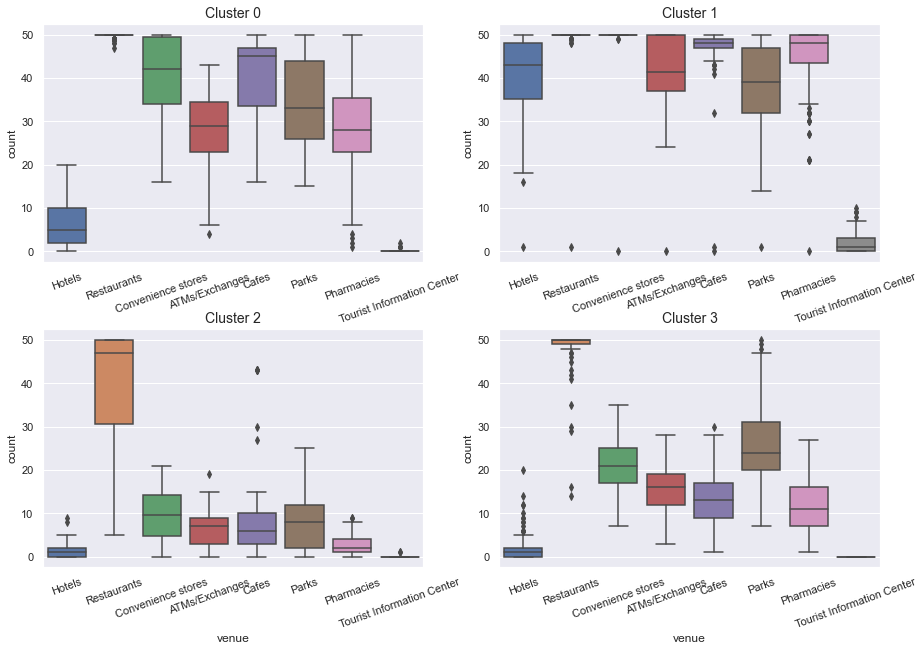

In [35]:
# make a boxplot for each cluster
fig = plt.figure(figsize=(15,10))
for i, plot in zip(range(1,5),[box_0,box_1,box_2,box_3]):
    ax = fig.add_subplot(2,2,i)
    plt.subplots_adjust(hspace=0.28)
    ax.set_title('Cluster {}'.format(i-1),fontsize=14)
    ax.set_xlabel('')
    ax.set_xticklabels(plot['venue'],rotation=20)
    sns.boxplot(x='venue',y='count',data=plot,ax=ax)
        

In [36]:
counts_nolabel = counts[columns]

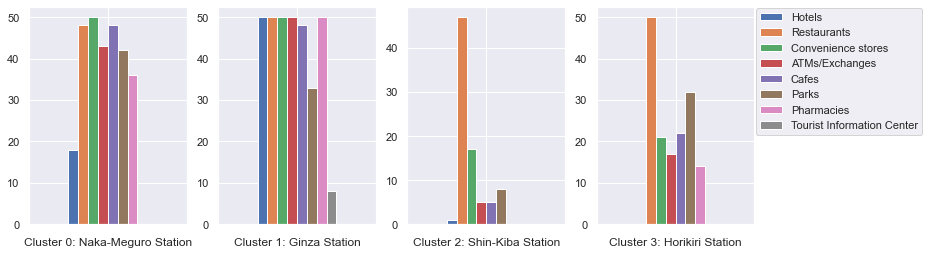

In [37]:
# pick one station for each cluster and plot them
examples = ['Naka-Meguro Station','Ginza Station','Shin-Kiba Station','Horikiri Station']
fig = plt.figure(figsize=(13,4))
for i,ex in zip(range(1,5),examples):
    ax = fig.add_subplot(1,4,i)
    if i == 1 or i == 2 or i == 3:
        counts_nolabel[counts_nolabel.index==ex].plot(kind='bar',ax=ax,legend=False)
        ax.set_xticklabels('')
        ax.set_xlabel('Cluster ' + str(i-1) + ': '  + ex, rotation=360)
    else:
        counts_nolabel[counts_nolabel.index==ex].plot(kind='bar',ax=ax)
        ax.legend(bbox_to_anchor=(0.5, 0.52, 1.6, 0.5))
        ax.set_xticklabels('')
        ax.set_xlabel('Cluster ' + str(i-1) + ': '  + ex, rotation=360)

In [38]:
# let's extract the stations where we need to develop
# extract cluster 2 and 3 data
station_2_3 = station_clustered[(station_clustered['cluster']==2) | (station_clustered['cluster']==3)]
station_2_3

,station,latitude,longitude,cluster
0,Adachi-Odai Station,35.754801,139.770404,3
1,Aihara Station,35.606819,139.331686,2
8,Akigawa Station,35.728075,139.286676,2
10,Akishima Station,35.702480,139.350065,2
11,Akitsu Station,35.778524,139.496679,2
...,...,...,...,...
619,Yamada Station,35.644365,139.321091,2
621,Yanokuchi Station,35.641679,139.520455,3
622,Yasaka Station,35.745160,139.467436,3
623,Yazaike Station,35.786641,139.768915,3


In [39]:
# get the crdinates of the center
tokyo = np.array([35.6828387,139.7594549])
# get the cordinates at anywhere on the line of 12km distance from the center
dst_12 = np.array([35.7645,139.6751])
# cordinates of stations in cluster 2,3
cordinates = np.array(station_2_3[['latitude','longitude']])

In [40]:
# get euclidean distance from the center to each points
from scipy.spatial import distance
dst = []
for cordinate in cordinates:
    dst.append(distance.sqeuclidean(tokyo,cordinate))

In [41]:
# define the euclidian distance 12km from Tokyo
max_dst = distance.sqeuclidean(tokyo,dst_12)
# extract the data within 12km radius
dst = np.array(dst)
result = station_2_3[dst <= max_dst]

In [42]:
result.shape

(38, 4)

In [43]:
# visualize them on the map
map_clusters = folium.Map(location=[35.6828387, 139.7594549], zoom_start=11)

folium.Circle(
[35.6828387, 139.7594549],
radius=12000,
color='black',
fill=False).add_to(map_clusters)

colors = ['#088A29', '#DF0101', '#58ACFA', '#0040FF']
for lat, lng, name, cluster in zip(result['latitude'], result['longitude'], 
                                  result['station'], result['cluster']):
    label = folium.Popup(str(name)+' Cluster '+str(cluster), parse_html=True)
    folium.CircleMarker(
    [lat,lng],
    popup=label,
    radius=3,
    color=colors[cluster],
    fill=True,
    fill_color=colors[cluster],
    fill_opacity=.7).add_to(map_clusters)

map_clusters.add_child(folium.LatLngPopup())
map_clusters

In [44]:
# there are some stations outside of the circle, dropthem and show them on the map again
drop_list = ['Kita-Akabane Station','Takenotsuka Station','Shōwajima Station','Toneri-kōen Station']
for item in drop_list:
    index = result[result['station']==item].index
    result.drop(index,axis=0,inplace=True)

C:\Users\belan\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [45]:
result = result.reset_index()
result.drop('index',inplace=True,axis=1)

In [46]:
result

,station,latitude,longitude,cluster
0,Adachi-Odai Station,35.754801,139.770404,3
1,Ariake Station,35.634574,139.793294,3
2,Ariake-Tennis-no-mori Station,35.640103,139.788792,3
3,Ayase Station,35.761651,139.824060,3
4,Funabori Station,35.684234,139.863792,3
5,Gotanno Station,35.765959,139.809497,3
6,Higashi-ojima Station,35.688918,139.849796,3
7,Hikawadai Station,35.749860,139.665078,3
8,Hirai Station,35.706421,139.842500,3
9,Horikiri Station,35.743418,139.817464,3


In [47]:
map_clusters = folium.Map(location=[35.6828387, 139.7594549], zoom_start=11)

folium.Circle(
[35.6828387, 139.7594549],
radius=12000,
color='black',
fill=False).add_to(map_clusters)

colors = ['#088A29', '#DF0101', '#58ACFA', '#0040FF']
for lat, lng, name, cluster in zip(result['latitude'], result['longitude'], 
                                  result['station'], result['cluster']):
    label = folium.Popup(str(name)+' Cluster '+str(cluster), parse_html=True)
    folium.CircleMarker(
    [lat,lng],
    popup=label,
    radius=5,
    color=colors[cluster],
    fill=True,
    fill_color=colors[cluster],
    fill_opacity=.7).add_to(map_clusters)

map_clusters

This is the area where we can develop better. 